In [1]:
import os
os.environ["TORCH_HOME"] = "/data/amathur-23/ROB313/"

In [2]:
import torch
import torch.nn as nn

from utils.datasets import WildfireDataset, show_image, load_image
from models import ResNetCoordsBinaryClassifier

backbone = 'resnet34'
device = "cuda:1"
model_path = "/data/amathur-23/ROB313/models/coords_et_classifier_trial_resnet34/best_model.pth"

model = ResNetCoordsBinaryClassifier(backbone=backbone)
model.load_state_dict(torch.load(model_path))
model = model.to(device)

Using resnet34 with 512 FC input features


In [3]:
dataset = WildfireDataset("/data/amathur-23/ROB313", split="test")
loader = torch.utils.data.DataLoader(dataset, batch_size=16, shuffle=True)

Loading meta file: /data/amathur-23/ROB313/test.csv


In [4]:
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt 

all_preds = []
all_labels = []

model.eval()

mis_filenames = []
mis_preds = []
mis_labels = []

for batch in tqdm(loader):
    images = batch["image"]
    coords = batch["coords"]
    labels = batch["label"]
    with torch.no_grad():
        outputs = model(images.to(device), coords.to(device))
    preds = torch.round(outputs).squeeze()

    preds = preds.detach().cpu().numpy()
    labels = labels.detach().cpu().numpy()

    all_preds.extend(preds)
    all_labels.extend(labels)

    # Find indices where prediction does not match the label
    mismatch_indices = (preds != labels).nonzero()[0]
    for i in mismatch_indices:
        mis_filenames.append(batch["filename"][i])
        mis_preds.append(preds[i])
        mis_labels.append(labels[i])    

100%|██████████| 394/394 [00:26<00:00, 14.83it/s]


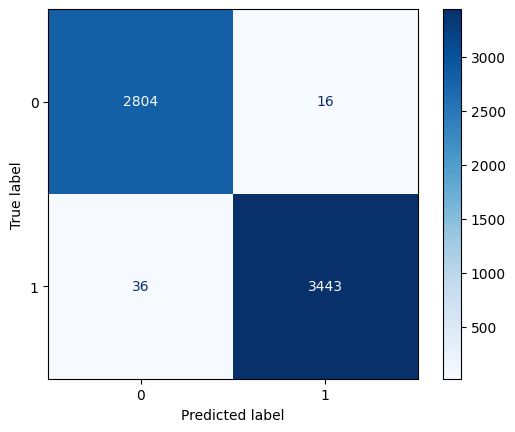

In [5]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay


# Compute confusion matrix
cm = confusion_matrix(all_labels, all_preds)

disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap=plt.cm.Blues)
plt.show()

In [6]:
from sklearn.metrics import f1_score

accuracy = np.sum(np.array(all_labels) == np.array(all_preds)) / len(all_labels)
print(f"Accuracy: {accuracy}")

f1 = f1_score(all_labels, all_preds)
print(f"F1 Score: {f1}")

Accuracy: 0.9917447213843468
F1 Score: 0.9925050446814644


Filename: /data/amathur-23/ROB313//test/nowildfire/-73.424636,45.618262.jpg, Prediction: 1.0, Label: 0.0



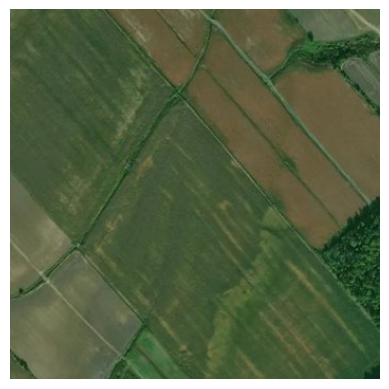

Filename: /data/amathur-23/ROB313//test/nowildfire/-73.418144,45.533425.jpg, Prediction: 1.0, Label: 0.0



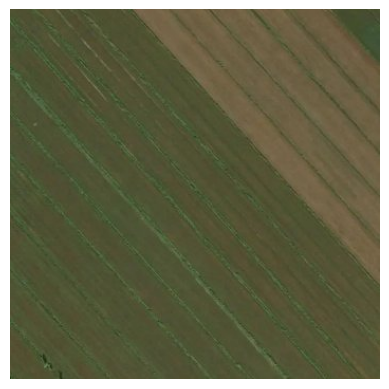

Filename: /data/amathur-23/ROB313//test/nowildfire/-73.653628,45.403439.jpg, Prediction: 1.0, Label: 0.0



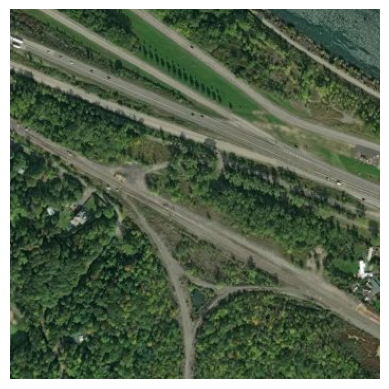

Filename: /data/amathur-23/ROB313//test/nowildfire/-73.869818,45.620859.jpg, Prediction: 1.0, Label: 0.0



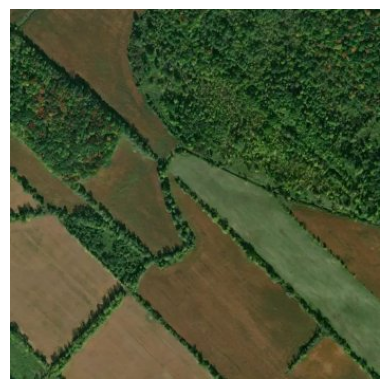

Filename: /data/amathur-23/ROB313//test/nowildfire/-75.727428,45.370731.jpg, Prediction: 1.0, Label: 0.0



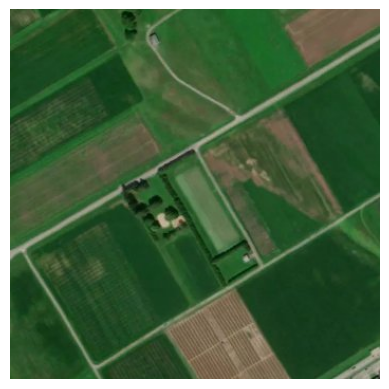

Filename: /data/amathur-23/ROB313//test/nowildfire/-73.413811,45.436142.jpg, Prediction: 1.0, Label: 0.0



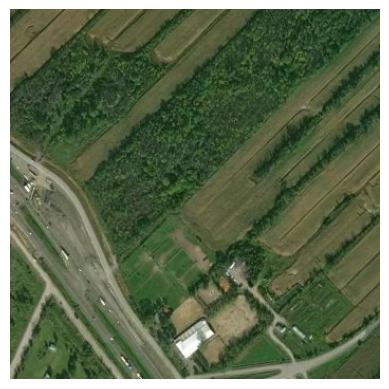

Filename: /data/amathur-23/ROB313//test/nowildfire/-73.890642,45.628564.jpg, Prediction: 1.0, Label: 0.0



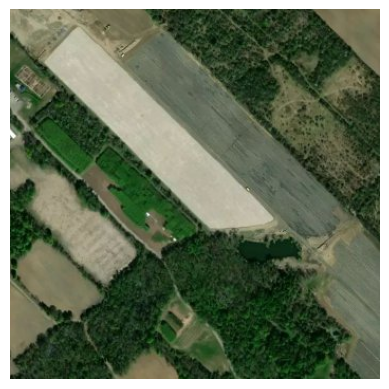

Filename: /data/amathur-23/ROB313//test/nowildfire/-73.889706,45.480311.jpg, Prediction: 1.0, Label: 0.0



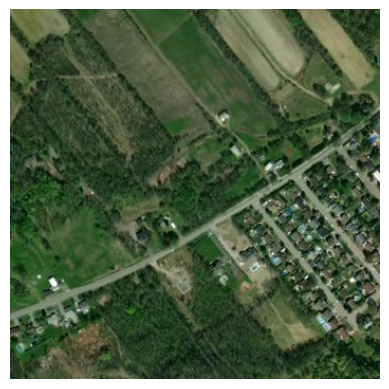

Filename: /data/amathur-23/ROB313//test/nowildfire/-73.908348,45.460625.jpg, Prediction: 1.0, Label: 0.0



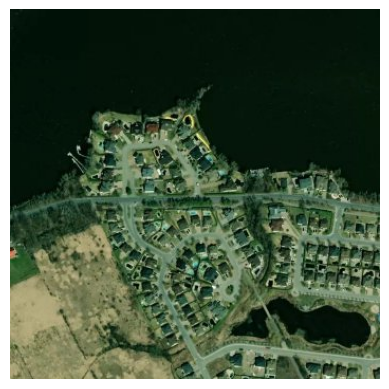

Filename: /data/amathur-23/ROB313//test/nowildfire/-75.593736,45.402003.jpg, Prediction: 1.0, Label: 0.0



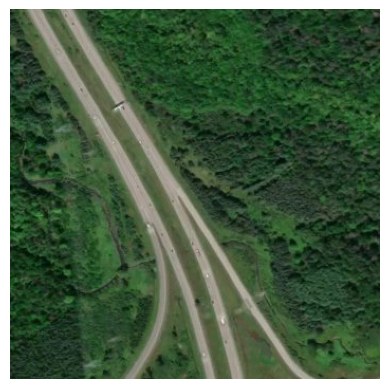

Filename: /data/amathur-23/ROB313//test/nowildfire/-75.790113,45.424707.jpg, Prediction: 1.0, Label: 0.0



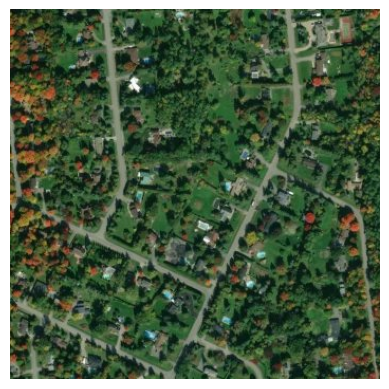

Filename: /data/amathur-23/ROB313//test/nowildfire/-75.806289,45.454627.jpg, Prediction: 1.0, Label: 0.0



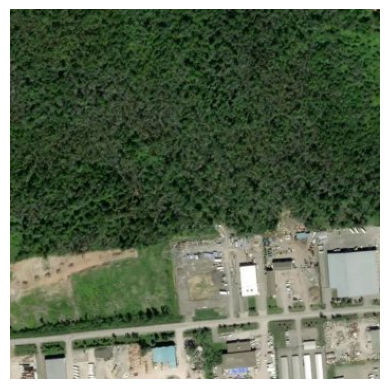

Filename: /data/amathur-23/ROB313//test/nowildfire/-75.773823,45.427802.jpg, Prediction: 1.0, Label: 0.0



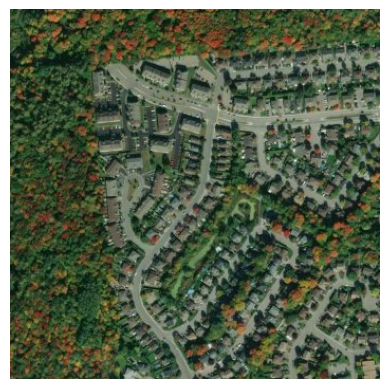

Filename: /data/amathur-23/ROB313//test/nowildfire/-73.899978,45.448048.jpg, Prediction: 1.0, Label: 0.0



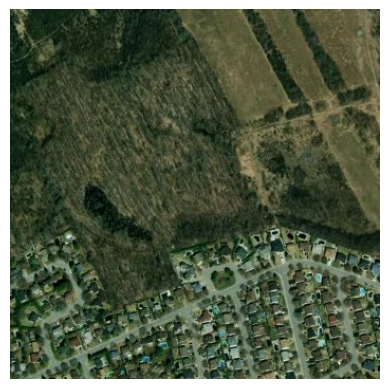

Filename: /data/amathur-23/ROB313//test/nowildfire/-73.476351,45.586536.jpg, Prediction: 1.0, Label: 0.0



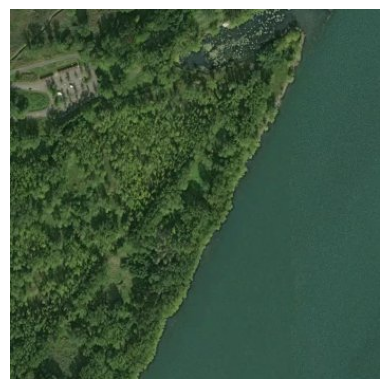

Filename: /data/amathur-23/ROB313//test/nowildfire/-75.743286,45.428948.jpg, Prediction: 1.0, Label: 0.0



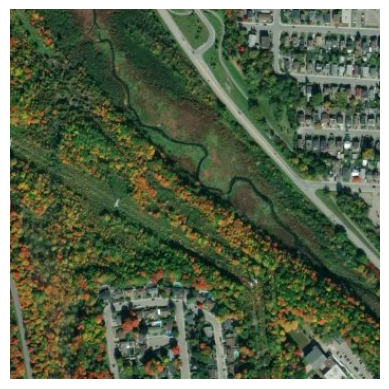

In [8]:
for fname, pred, label in zip(mis_filenames, mis_preds, mis_labels):
    if label == 1:
        continue
    print(f"Filename: {fname}, Prediction: {pred}, Label: {label}")
    print("")
    show_image(load_image(fname))

Filename: /data/amathur-23/ROB313//test/wildfire/-71.15219,46.8765.jpg, Prediction: 0.0, Label: 1.0



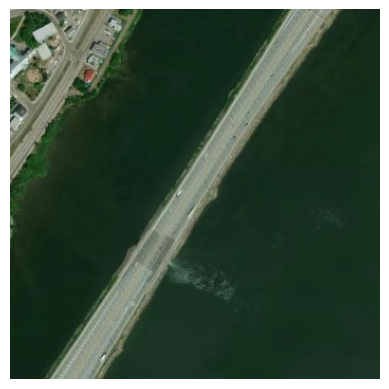

Filename: /data/amathur-23/ROB313//test/wildfire/-74.01695,45.21523.jpg, Prediction: 0.0, Label: 1.0



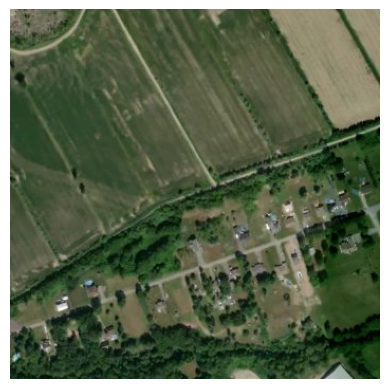

Filename: /data/amathur-23/ROB313//test/wildfire/-72.16825,45.2485.jpg, Prediction: 0.0, Label: 1.0



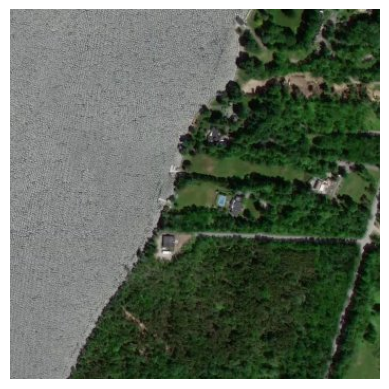

Filename: /data/amathur-23/ROB313//test/wildfire/-75.74353,45.95624.jpg, Prediction: 0.0, Label: 1.0



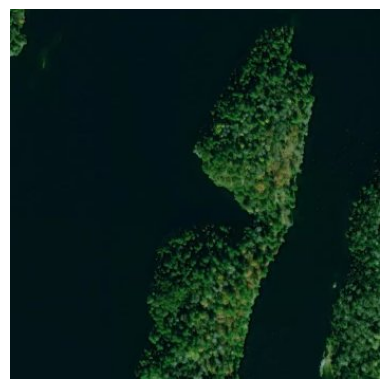

Filename: /data/amathur-23/ROB313//test/wildfire/-74.13303,45.96253.jpg, Prediction: 0.0, Label: 1.0



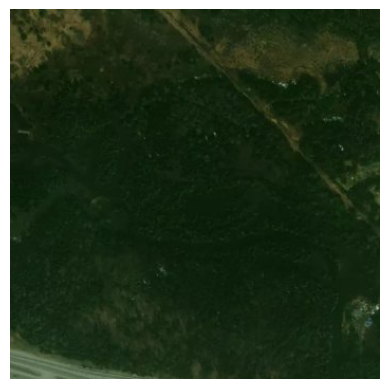

Filename: /data/amathur-23/ROB313//test/wildfire/-74.90359,46.52968.jpg, Prediction: 0.0, Label: 1.0



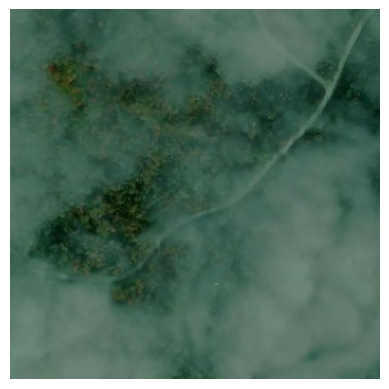

Filename: /data/amathur-23/ROB313//test/wildfire/-75.70467,46.01709.jpg, Prediction: 0.0, Label: 1.0



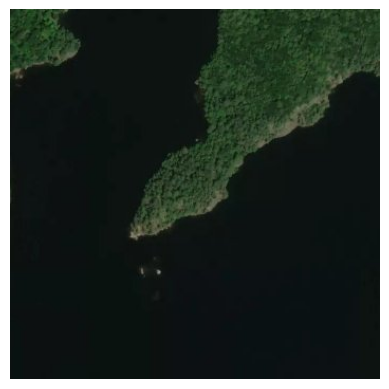

Filename: /data/amathur-23/ROB313//test/wildfire/-73.8011,45.76799.jpg, Prediction: 0.0, Label: 1.0



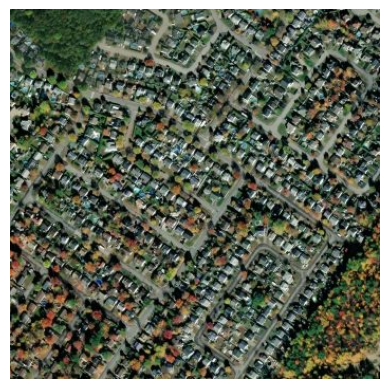

Filename: /data/amathur-23/ROB313//test/wildfire/-73.72935,45.83333.jpg, Prediction: 0.0, Label: 1.0



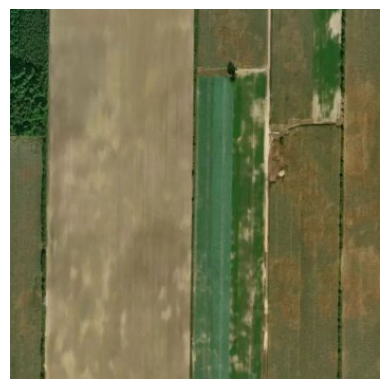

Filename: /data/amathur-23/ROB313//test/wildfire/-75.4319,45.5622.jpg, Prediction: 0.0, Label: 1.0



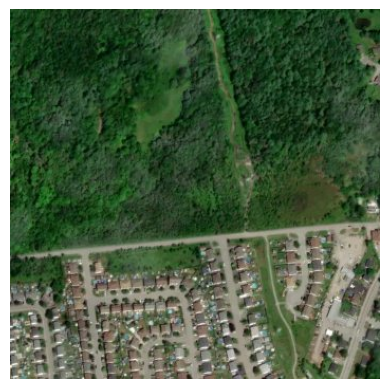

Filename: /data/amathur-23/ROB313//test/wildfire/-75.74871,45.96613.jpg, Prediction: 0.0, Label: 1.0



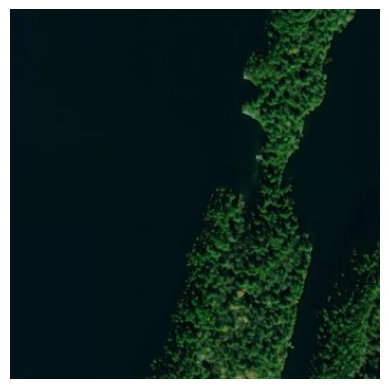

Filename: /data/amathur-23/ROB313//test/wildfire/-73.84988,45.55935.jpg, Prediction: 0.0, Label: 1.0



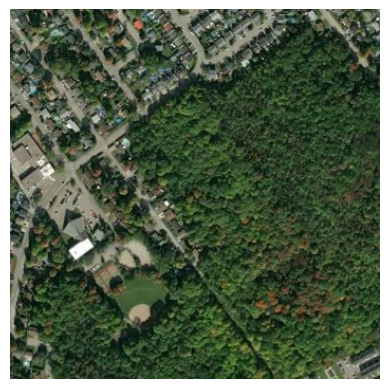

Filename: /data/amathur-23/ROB313//test/wildfire/-73.4078,45.805.jpg, Prediction: 0.0, Label: 1.0



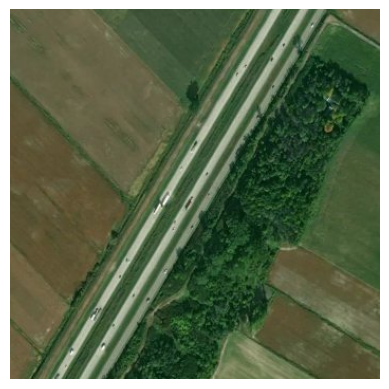

Filename: /data/amathur-23/ROB313//test/wildfire/-70.86997,46.11031.jpg, Prediction: 0.0, Label: 1.0



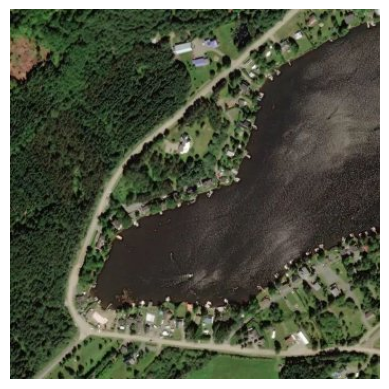

Filename: /data/amathur-23/ROB313//test/wildfire/-72.15133,45.28597.jpg, Prediction: 0.0, Label: 1.0



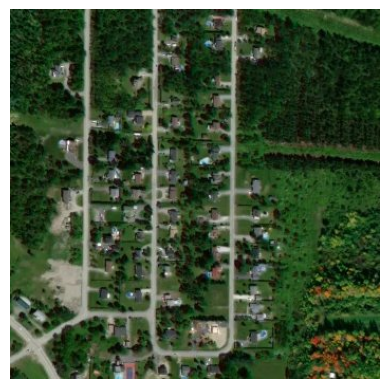

Filename: /data/amathur-23/ROB313//test/wildfire/-75.7203,45.9889.jpg, Prediction: 0.0, Label: 1.0



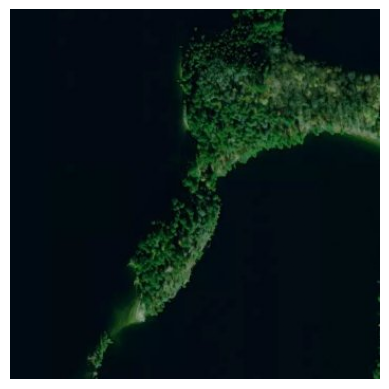

Filename: /data/amathur-23/ROB313//test/wildfire/-74.355,45.6436.jpg, Prediction: 0.0, Label: 1.0



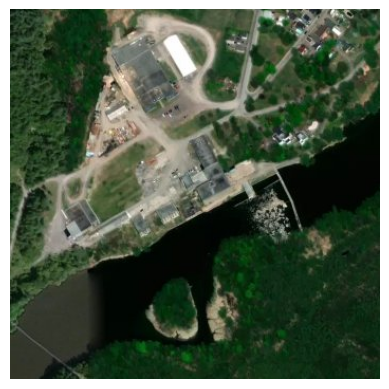

Filename: /data/amathur-23/ROB313//test/wildfire/-77.1864,46.0193.jpg, Prediction: 0.0, Label: 1.0



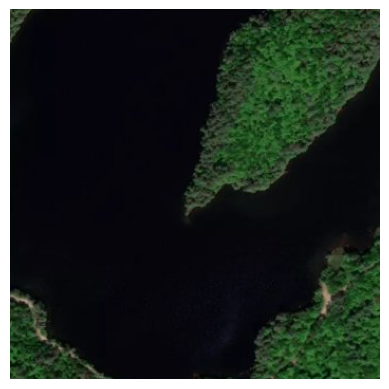

Filename: /data/amathur-23/ROB313//test/wildfire/-74.31421,45.1274.jpg, Prediction: 0.0, Label: 1.0



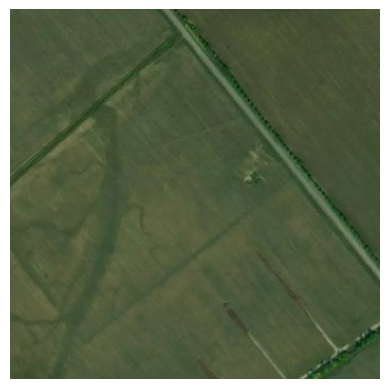

Filename: /data/amathur-23/ROB313//test/wildfire/-76.07552,46.28867.jpg, Prediction: 0.0, Label: 1.0



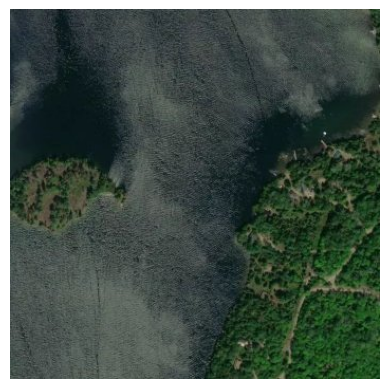

Filename: /data/amathur-23/ROB313//test/wildfire/-74.00926,45.24041.jpg, Prediction: 0.0, Label: 1.0



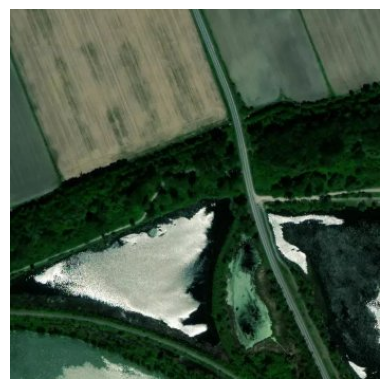

Filename: /data/amathur-23/ROB313//test/wildfire/-74.1015,45.2552.jpg, Prediction: 0.0, Label: 1.0



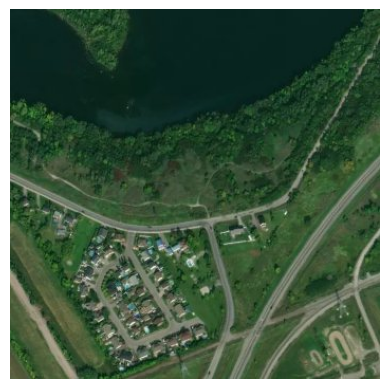

Filename: /data/amathur-23/ROB313//test/wildfire/-73.4715,46.04137.jpg, Prediction: 0.0, Label: 1.0



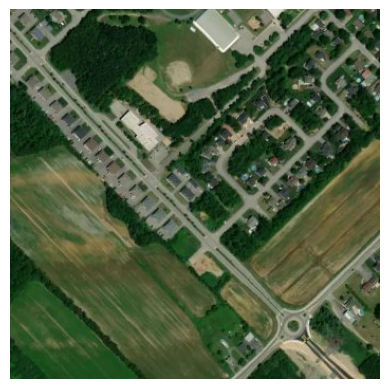

Filename: /data/amathur-23/ROB313//test/wildfire/-73.11227,46.01889.jpg, Prediction: 0.0, Label: 1.0



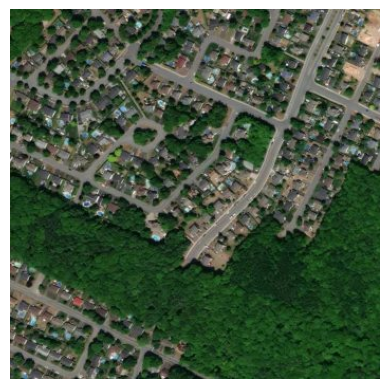

Filename: /data/amathur-23/ROB313//test/wildfire/-72.51685,46.3765.jpg, Prediction: 0.0, Label: 1.0



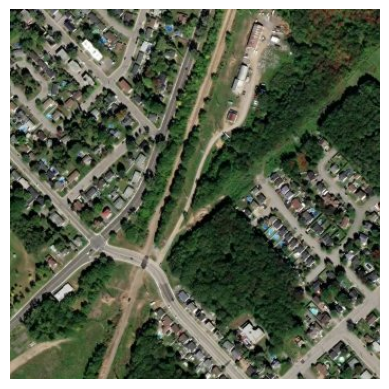

Filename: /data/amathur-23/ROB313//test/wildfire/-77.26275,47.52608.jpg, Prediction: 0.0, Label: 1.0



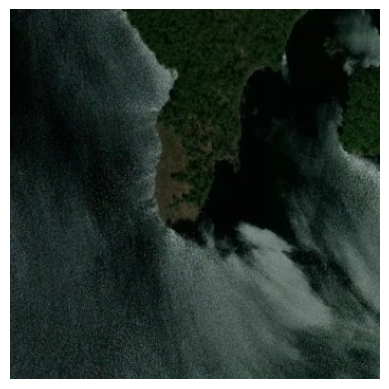

Filename: /data/amathur-23/ROB313//test/wildfire/-73.07949,45.44005.jpg, Prediction: 0.0, Label: 1.0



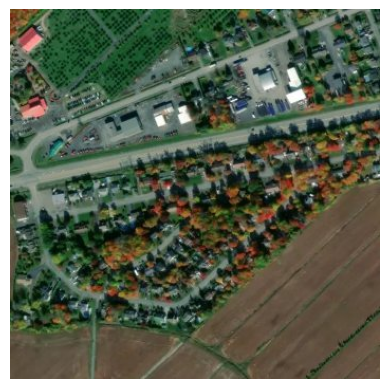

Filename: /data/amathur-23/ROB313//test/wildfire/-73.17269,45.73951.jpg, Prediction: 0.0, Label: 1.0



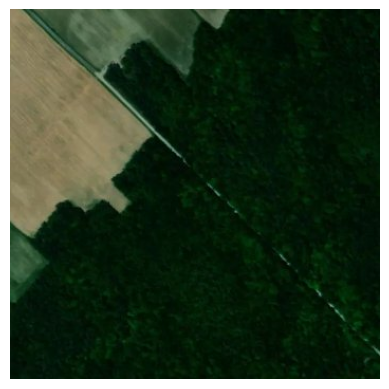

Filename: /data/amathur-23/ROB313//test/wildfire/-73.7572,45.81745.jpg, Prediction: 0.0, Label: 1.0



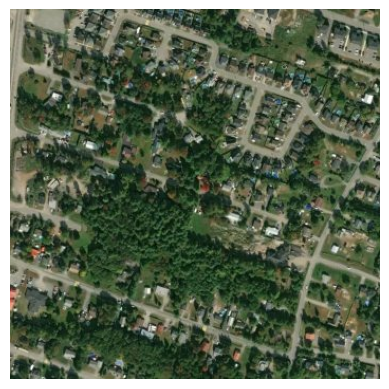

Filename: /data/amathur-23/ROB313//test/wildfire/-75.0467,46.6892.jpg, Prediction: 0.0, Label: 1.0



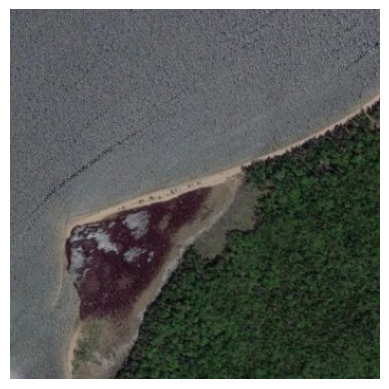

Filename: /data/amathur-23/ROB313//test/wildfire/-73.1564,45.49761.jpg, Prediction: 0.0, Label: 1.0



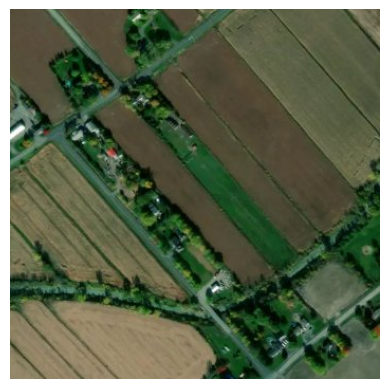

Filename: /data/amathur-23/ROB313//test/wildfire/-73.11228,46.01169.jpg, Prediction: 0.0, Label: 1.0



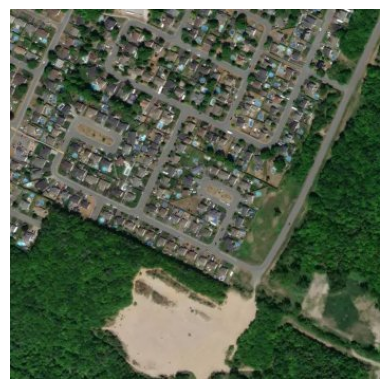

Filename: /data/amathur-23/ROB313//test/wildfire/-76.17669,45.63459.jpg, Prediction: 0.0, Label: 1.0



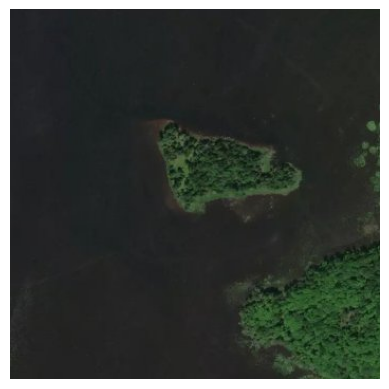

Filename: /data/amathur-23/ROB313//test/wildfire/-75.7997,45.96163.jpg, Prediction: 0.0, Label: 1.0



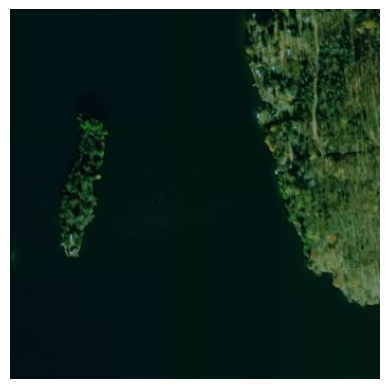

Filename: /data/amathur-23/ROB313//test/wildfire/-75.77301,45.51799.jpg, Prediction: 0.0, Label: 1.0



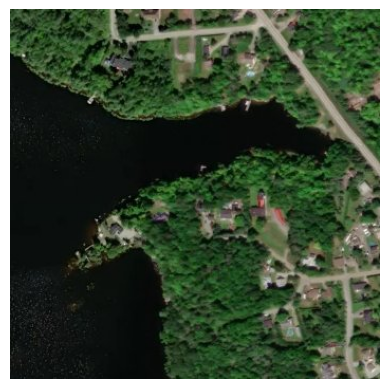

Filename: /data/amathur-23/ROB313//test/wildfire/-74.21676,45.29317.jpg, Prediction: 0.0, Label: 1.0



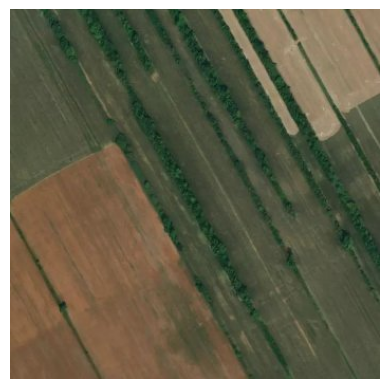

In [9]:
for fname, pred, label in zip(mis_filenames, mis_preds, mis_labels):
    if label == 0:
        continue
    print(f"Filename: {fname}, Prediction: {pred}, Label: {label}")
    print("")
    show_image(load_image(fname))